In [1]:
import pandas as pd
import json
import os
import matplotlib as mpl
from matplotlib import pyplot as plt
import requests
from io import StringIO as sio
from matplotlib.patches import Patch
import matplotlib.ticker as ticker
import itertools
import re
import sys
import pprint
import statistics
import balticEdited as bt

In [2]:
def load_tree(filename):
    mytree, meta = bt.loadJSON(filename)
    return(mytree)

filename = 'auspice/h3nx_ha.json'
mytree = load_tree(filename)


Tree height: 112.710000
Tree length: 11711.559000
annotations present

Numbers of objects in tree: 10916 (4812 nodes and 6104 leaves)



In [10]:
main_hosts_colors = {
    "Avian": "#b6282e",
    "Equine": "#e9c46a",     
    "Human": "#f4a261",     
    "Canine": "#7fbadc",
    "Swine": "#33659e"      
}


secondary_hosts_colors = {
    "Camel": "#f0736a",      
    "Feline": "#fee08b",     
    "Seal": "#c0b5d4",       
    "Mink": "#b4e6b4"        
}

host_colors = {**main_hosts_colors, **secondary_hosts_colors}

region_colors = {
    'Europe': '#9e0142',
    'Japan Korea': '#d53e4f',
    'Southeast Asia': '#f46d43',
    'West Asia': '#fdae61',
    'South America': '#fee08b',
    'South Asia' : '#e6f598',
    'Africa': '#abdda4',
    'China': '#66c2a5',
    'Oceania': '#3288bd',
    'North America': '#5e4fa2'
}

In [4]:
# BIG SUPPLEMENTARY
def plot_supp(mytree):
    
    plt.rcParams["font.family"] = "Arial"

    fig, ax = plt.subplots(figsize=(30, 50))

    x_attr = lambda k: k.absoluteTime
    
    color_by = lambda k: host_colors.get(k.traits["node_attrs"]["host"]["value"])

    mytree.plotTree(ax, x_attr=x_attr, colour=color_by, width=3)
    
    def canine_func(k):
        if k.traits["node_attrs"]["host"]["value"] == "Canine":
            return 100
        else:
            return 0
        
    def camel_func(k):
        if k.traits["node_attrs"]["host"]["value"] == "Camel":
            return 100
        else:
            return 0

    def other_func(k):
        if k.traits["node_attrs"]["host"]["value"] != "Canine" or k.traits["node_attrs"]["host"]["value"] != "Equine":
            return 100
        else:
            return 0
        
    
    mytree.plotPoints(ax,
                   x_attr=x_attr,
                   size=lambda k: other_func(k),
                   colour=color_by,
                   outline_colour='black',
                   zorder=2,
                   marker='o',
                   edgecolor='black'
                     )
    
    mytree.plotPoints(ax,
                   x_attr=x_attr,
                   size=lambda k: canine_func(k),
                   colour=color_by,
                   outline_colour='black',
                   zorder=5,
                   marker='o',
                   edgecolor='black'
                     )
    
    mytree.plotPoints(ax,
                   x_attr=x_attr,
                   size=lambda k: camel_func(k),
                   colour=color_by,
                   outline_colour='black',
                   zorder=5,
                   marker='o',
                   edgecolor='black'
                     )

    # Create legend with main hosts on left, secondary on right
    main_handles = [Patch(color=color, label=host) 
                    for host, color in main_hosts_colors.items()]
    
    secondary_handles = [Patch(color=color, label=host) 
                         for host, color in secondary_hosts_colors.items()]
    


    # main hosts
    legend1 = ax.legend(handles=main_handles, 
                    loc="lower left", 
                    fontsize='100',
                    frameon=False,
                    handletextpad=0.4)

    # secondary hosts
    legend2 = ax.legend(handles=secondary_handles,
                    loc="lower left",
                    bbox_to_anchor=(0.30, 0.00005),
                    fontsize='100',
                    frameon=False,
                    handletextpad=0.3)

    ax.add_artist(legend1)

    ax.text(0.47, 0.19, "$\\bf{Spillovers:}$", fontsize=95, transform=ax.transAxes, 
            ha='center', va='bottom', weight='bold', fontfamily='Arial')
    
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    ax.set_yticks([])
    ax.set_yticklabels([])
    [ax.spines[loc].set_visible(False) for loc in ax.spines if loc not in ['bottom']]
    ax.tick_params(axis='x', labelsize=70, size=30, width=2, color='grey')
    
    fig.tight_layout()
     
    plt.savefig("plots/supp-ha-time-tree.png")
    plt.show()

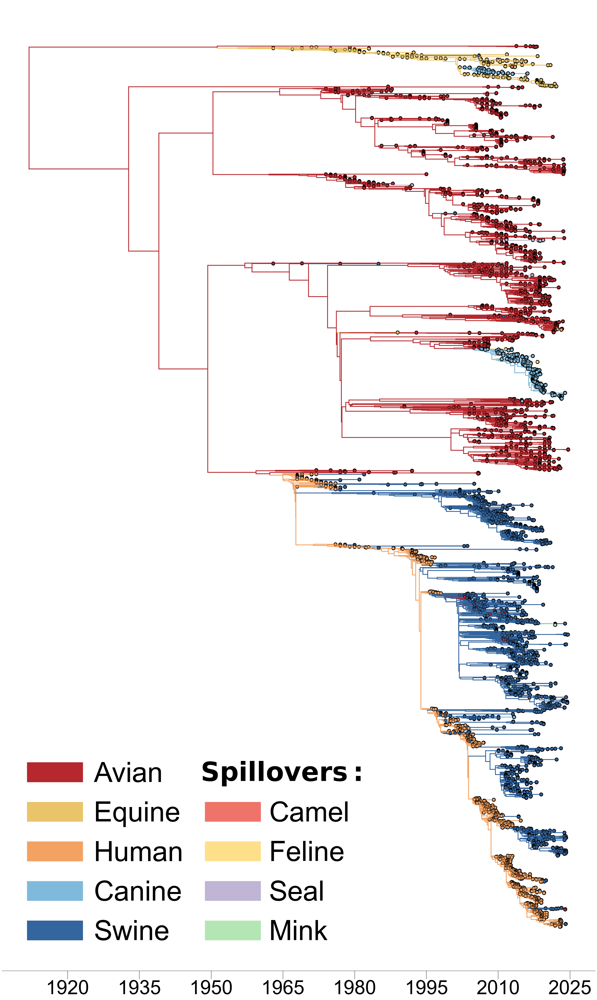

In [5]:
plot_supp(mytree)

In [6]:
# MAIN FIGURE

def plot_host(mytree, gene):
    
    plt.rcParams["font.family"] = "Arial"

    fig, ax = plt.subplots(figsize=(20, 15))

    x_attr = lambda k: k.absoluteTime
    
    color_by = lambda k: host_colors.get(k.traits["node_attrs"]["host"]["value"])

    mytree.plotTree(ax, x_attr=x_attr, colour=color_by, width=3)
    
    def canine_func(k):
        if k.traits["node_attrs"]["host"]["value"] == "Canine":
            return 100
        else:
            return 0
        
    def camel_func(k):
        if k.traits["node_attrs"]["host"]["value"] == "Camel":
            return 100
        else:
            return 0

    def other_func(k):
        if k.traits["node_attrs"]["host"]["value"] != "Canine" or k.traits["node_attrs"]["host"]["value"] != "Equine":
            return 100
        else:
            return 0
        
    
    mytree.plotPoints(ax,
                   x_attr=x_attr,
                   size=lambda k: other_func(k),
                   colour=color_by,
                   outline_colour='black',
                   zorder=2,
                   marker='o',
                   edgecolor='black'
                     )
    
    mytree.plotPoints(ax,
                   x_attr=x_attr,
                   size=lambda k: canine_func(k),
                   colour=color_by,
                   outline_colour='black',
                   zorder=5,
                   marker='o',
                   edgecolor='black'
                     )
    
    mytree.plotPoints(ax,
                   x_attr=x_attr,
                   size=lambda k: camel_func(k),
                   colour=color_by,
                   outline_colour='black',
                   zorder=5,
                   marker='o',
                   edgecolor='black'
                     )

    # Create legend with main hosts on left, secondary on right
    main_handles = [Patch(color=color, label=host) 
                    for host, color in main_hosts_colors.items()]
    secondary_handles = [Patch(color=color, label=host) 
                         for host, color in secondary_hosts_colors.items()]
    
    if gene == "ha":
        # main hosts
        legend1 = ax.legend(handles=main_handles, 
                        loc="lower left", 
                        fontsize='35',
                        frameon=False)

        # secondary hosts
        legend2 = ax.legend(handles=secondary_handles,
                        loc="lower left",
                        bbox_to_anchor=(0.18, 0.0004),
                        fontsize='35',
                        frameon=False)

        ax.add_artist(legend1)

        ax.text(0.27, 0.23, "$\\bf{Spillovers:}$", fontsize=33, transform=ax.transAxes, 
                ha='center', va='bottom', weight='bold', fontfamily='Arial')
    
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    ax.set_yticks([])
    ax.set_yticklabels([])
    [ax.spines[loc].set_visible(False) for loc in ax.spines if loc not in ['bottom']]
    ax.tick_params(axis='x', labelsize=30, size=15, width=2, color='grey')
    
    fig.tight_layout()
     
    plt.savefig(f"plots/{gene}-time-tree.pdf")
    plt.show()

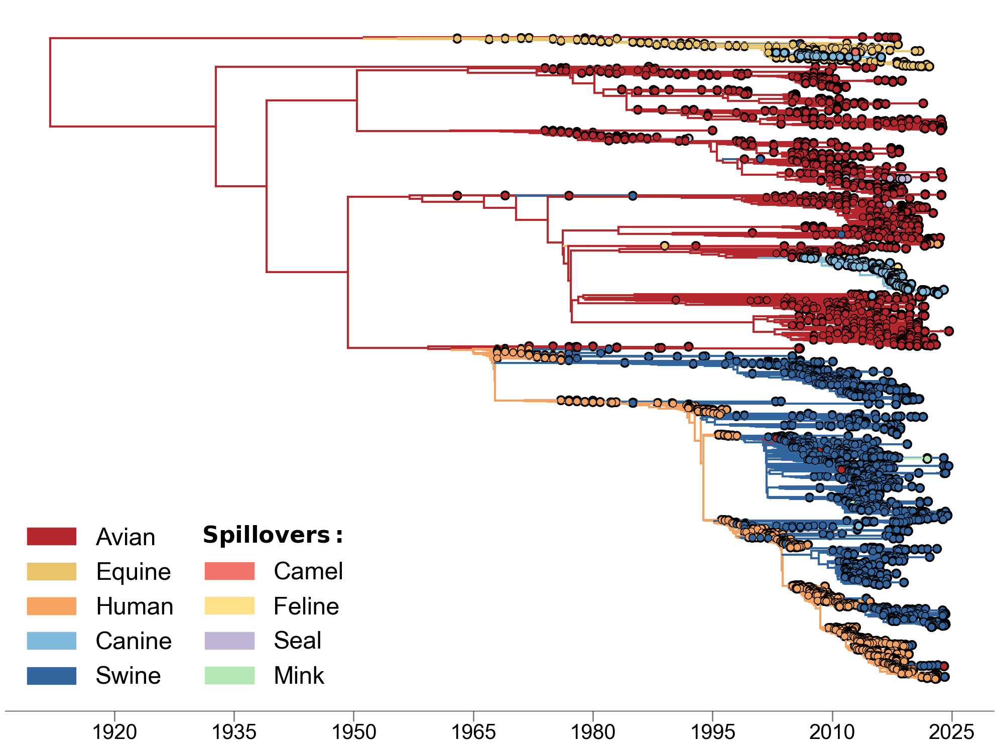

In [7]:
plot_host(mytree, "ha")


Tree height: 114.944000
Tree length: 14065.716000
annotations present

Numbers of objects in tree: 10956 (4852 nodes and 6104 leaves)

pb2


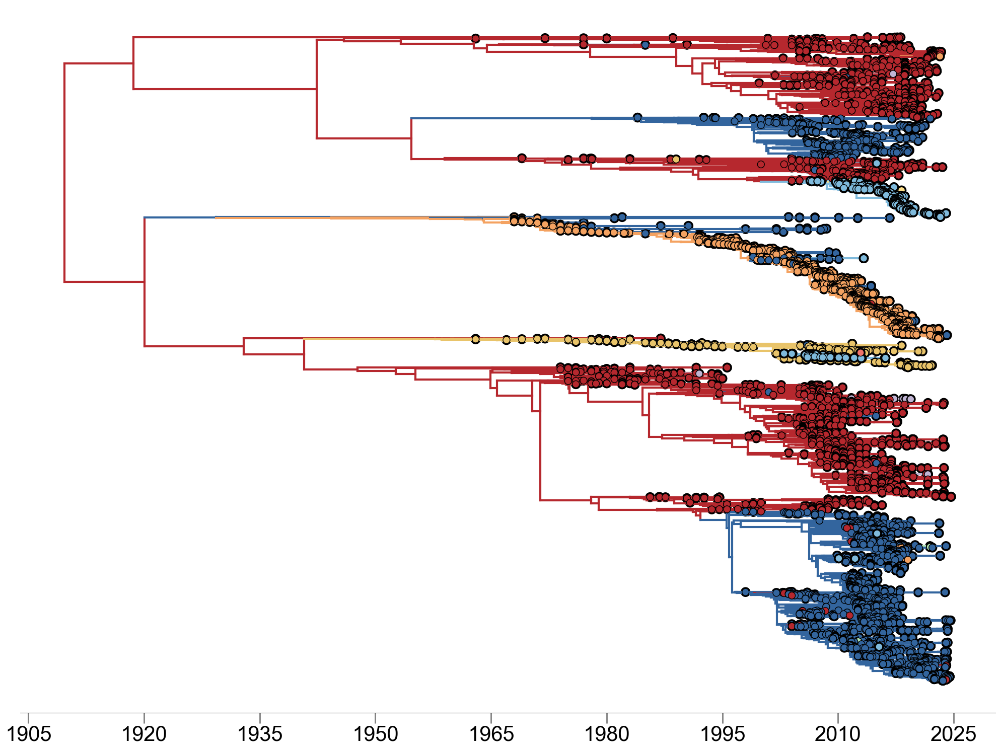


Tree height: 119.988000
Tree length: 14817.841000
annotations present

Numbers of objects in tree: 11006 (4884 nodes and 6122 leaves)

pb1


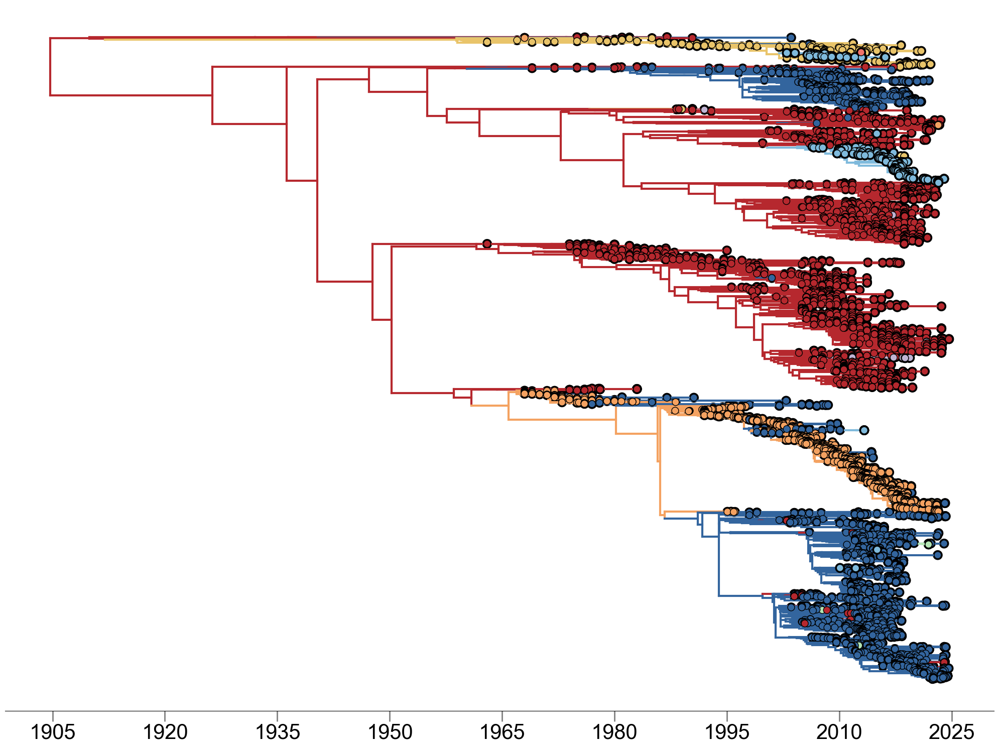


Tree height: 76.235000
Tree length: 13785.455000
annotations present

Numbers of objects in tree: 11208 (5104 nodes and 6104 leaves)

na


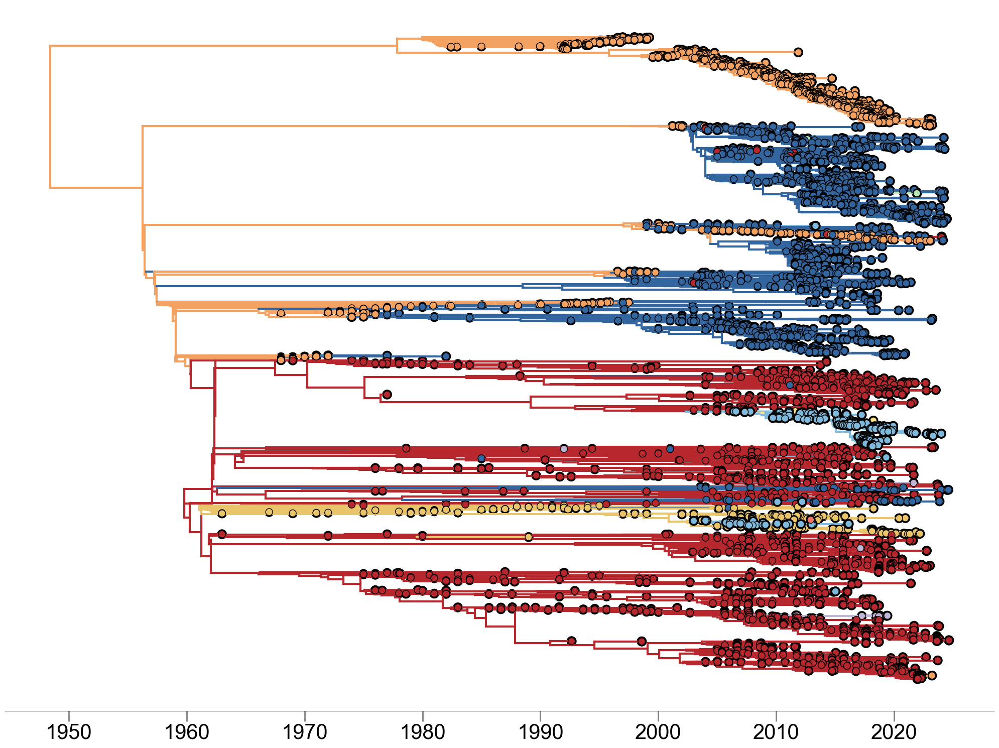


Tree height: 123.804000
Tree length: 22070.966000
annotations present

Numbers of objects in tree: 10910 (4806 nodes and 6104 leaves)

np


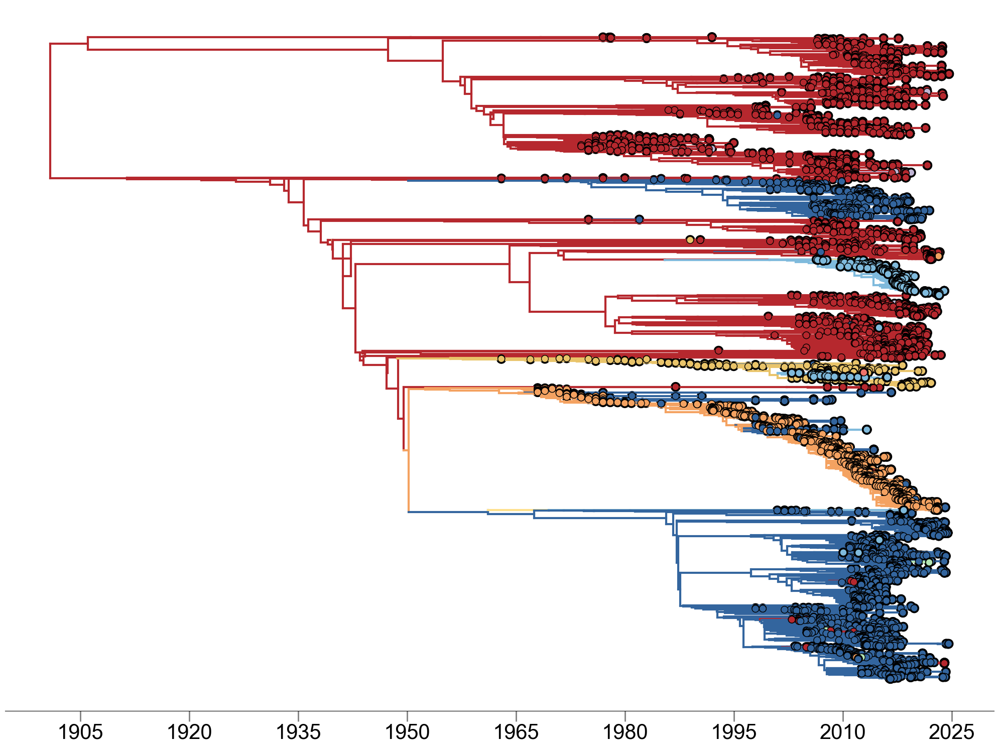


Tree height: 114.420000
Tree length: 14356.227000
annotations present

Numbers of objects in tree: 11019 (4915 nodes and 6104 leaves)

pa


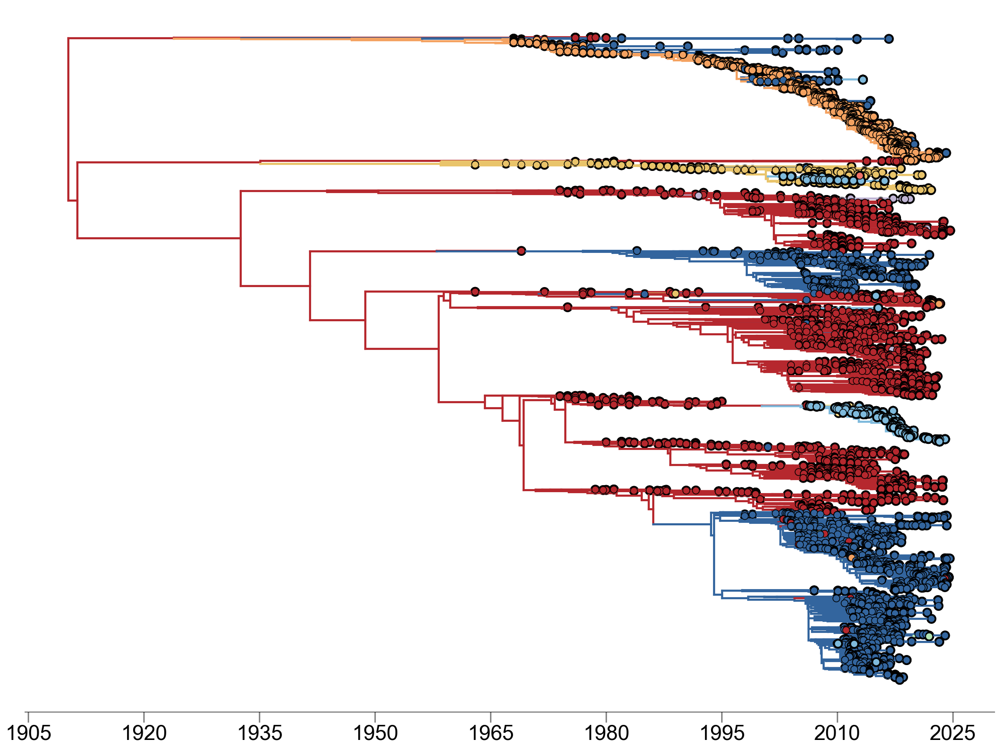


Tree height: 204.125000
Tree length: 30138.906000
annotations present

Numbers of objects in tree: 10846 (4724 nodes and 6122 leaves)

ns


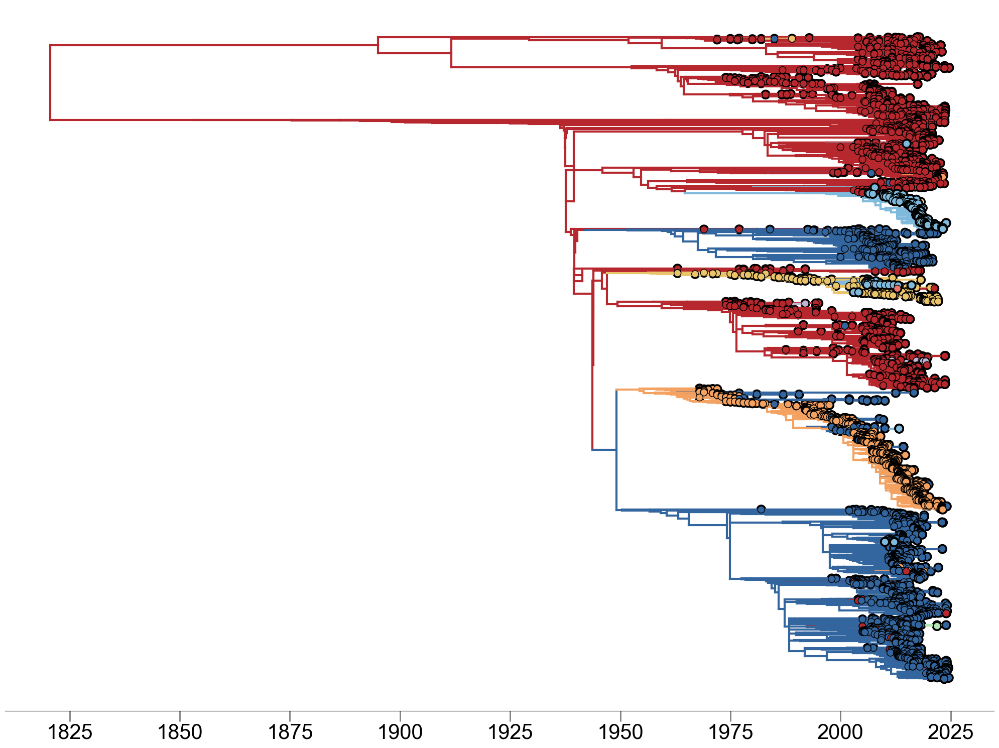


Tree height: 79.638000
Tree length: 17510.147000
annotations present

Numbers of objects in tree: 10790 (4668 nodes and 6122 leaves)

mp


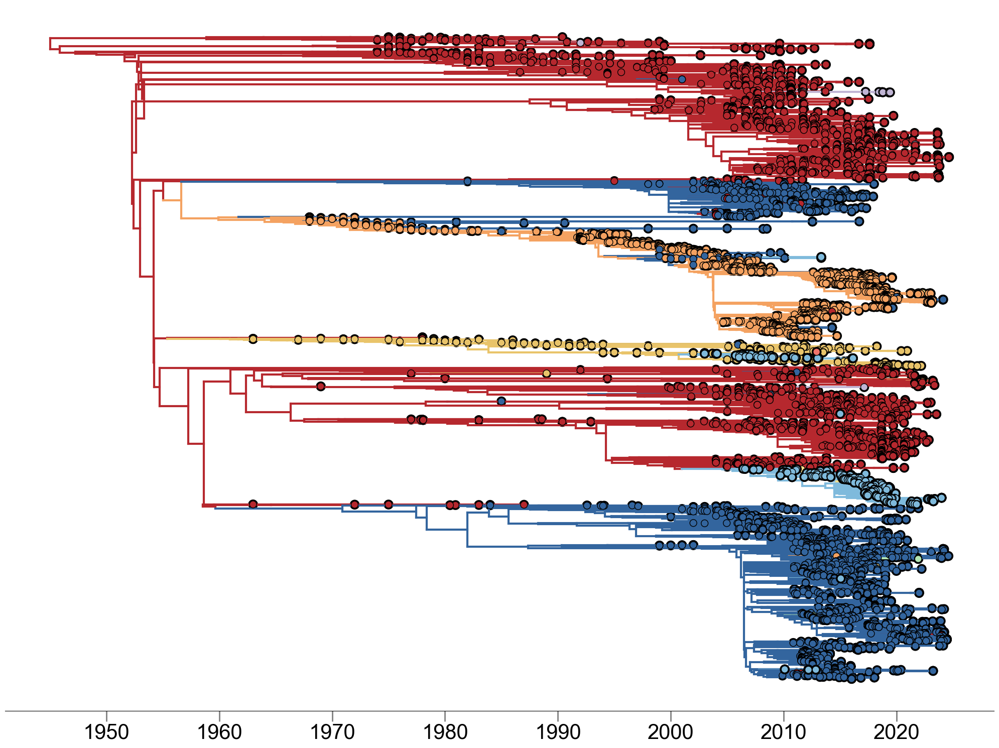

In [8]:
def load_tree(filename):
    mytree, meta = bt.loadJSON(filename)
    return(mytree)

list_of_genes = ["pb2","pb1","na","np","pa","ns","mp"]

for gene in list_of_genes:

    filename = f"auspice/h3nx_{gene}.json"

    mytree = load_tree(filename)
    
    print(gene)
    plot_host(mytree, gene)
    



In [12]:
# making supplementary swine-host trees
def load_tree(filename):
    mytree, meta = bt.loadJSON(filename)
    return(mytree)

filename = 'auspice/h3nx_ha.json'
mytree = load_tree(filename)

#NODE_0002963

for k in mytree.Objects:
    if k.is_node() and k.name == "NODE_0002963":
        traverse_condition=lambda w: w.traits["host"]=="human" or w.traits["host"]=="swine"
        tree = mytree.subtree(k)

print(tree)


Tree height: 112.710000
Tree length: 11711.559000
annotations present

Numbers of objects in tree: 10916 (4812 nodes and 6104 leaves)



In [17]:
def plot_host(mytree, host, gene):
    
    plt.rcParams["font.family"] = "Arial"

    fig, ax = plt.subplots(figsize=(15, 15))

    x_attr = lambda k: k.absoluteTime
    
    color_by = lambda k: host_colors.get(k.traits["node_attrs"]["host"]["value"])

    mytree.plotTree(ax, x_attr=x_attr, colour=color_by, width=3)
    
    #  legend to only have hosts in tree
    hosts_in_tree = set()
    for k in mytree.Objects:
        if hasattr(k, 'traits') and 'node_attrs' in k.traits and 'host' in k.traits['node_attrs']:
            hosts_in_tree.add(k.traits["node_attrs"]["host"]["value"])
        
    mytree.plotPoints(ax,
                   x_attr=x_attr,
                   size=200,
                   colour=color_by,
                   outline_colour='#3f3f3f',
                   zorder=2,
                   marker='o',
                   edgecolor='#3f3f3f')

    legend_handles = [Patch(color=host_colors[h], label=h) 
                      for h in hosts_in_tree 
                      if h in host_colors]

    legend = ax.legend(handles=legend_handles, title="$\\bf{Hosts}$", loc="lower left", fontsize='35')
    plt.setp(legend.get_title(),fontsize=35)
    
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_yticks([])
    ax.set_yticklabels([])
    [ax.spines[loc].set_visible(False) for loc in ax.spines if loc not in ['bottom']]
    ax.tick_params(axis='x',labelsize=25,size=15, width=2,color='grey')
    
     
    plt.savefig(f"plots/{host}-{gene}-time-tree.pdf")
    plt.show()

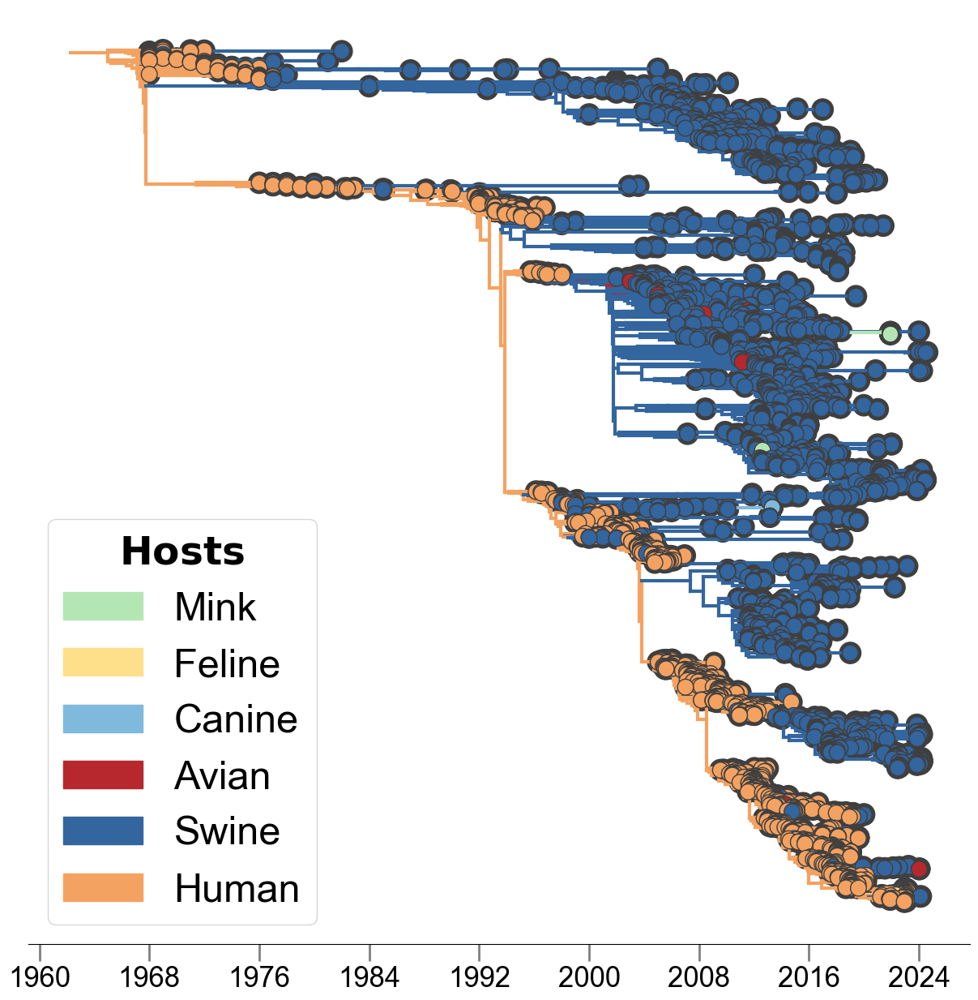

In [18]:
plot_host(tree, "swine-human", "ha")

In [14]:
def plot_region(tree, host, gene):
    
    plt.rcParams["font.family"] = "Arial"

    fig, ax = plt.subplots(figsize=(15, 15))

    x_attr = lambda k: k.absoluteTime
    
    color_by = lambda k: region_colors.get(k.traits["node_attrs"]["region"]["value"])
    
    tree.plotTree(ax, x_attr=x_attr,colour=color_by, width = 5)
    
    def canine_func(k):
        
        if k.traits["node_attrs"]["host"]["value"] == "Canine":
            return 200
        else:
            return 0

    def other_func(k):
        
        if k.traits["node_attrs"]["host"]["value"] != "Canine":
            return 200
        else:
            return 0
        
    
    tree.plotPoints(ax,
                   x_attr=x_attr,
                   size= lambda k: other_func(k),
                   colour=color_by,
                   outline_colour='#3f3f3f',
                   zorder=2,
                   marker='o',
                   edgecolor='#3f3f3f'
                     )
    
    tree.plotPoints(ax,
                   x_attr=x_attr,
                   size= lambda k: canine_func(k),
                   colour=color_by,
                   outline_colour='#3f3f3f',
                   zorder=5,
                   marker='o',
                   edgecolor='#3f3f3f'
                     )

    observed_region = {k.traits["node_attrs"]["region"]["value"] for k in tree.Objects if "region" in k.traits["node_attrs"]}

    legend_handles = [Patch(color=color, label=region) for region, color in region_colors.items() if region in observed_region]

    legend = ax.legend(handles=legend_handles, title="$\\bf{Regions}$", loc="lower left", fontsize='35')
    plt.setp(legend.get_title(), fontsize=35)
    
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))

    ax.set_yticks([])
    ax.set_yticklabels([])
    [ax.spines[loc].set_visible(False) for loc in ax.spines if loc not in ['bottom']]
    ax.tick_params(axis='x',labelsize=30,size=15, width=2,color='grey')
    # ax.set_xlabel("Time", fontsize=20, fontweight="bold")
    fig.tight_layout()
     
    plt.savefig("plots/{host}_{gene}-region-tree.pdf")
    plt.show()

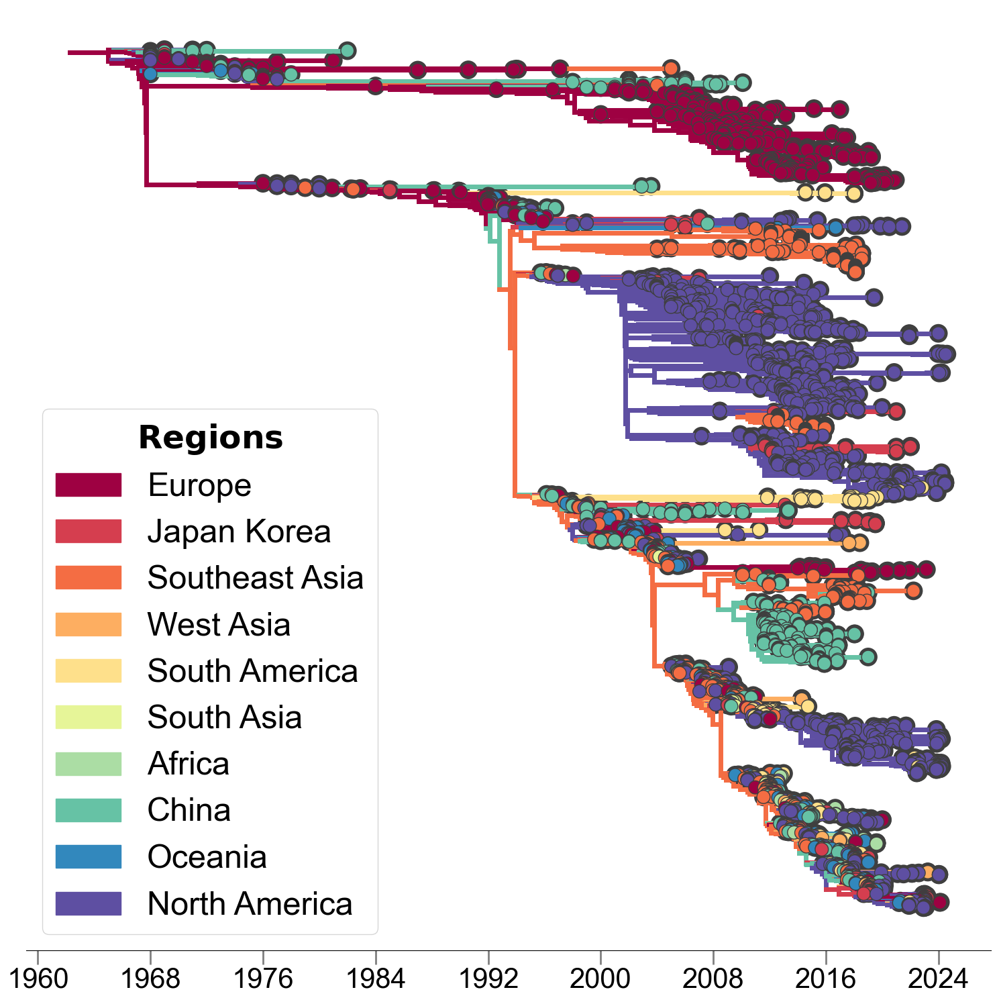

In [15]:
#swine-human tree
plot_region(tree, "swine-human", "ha")